In [1]:
# Lab 1

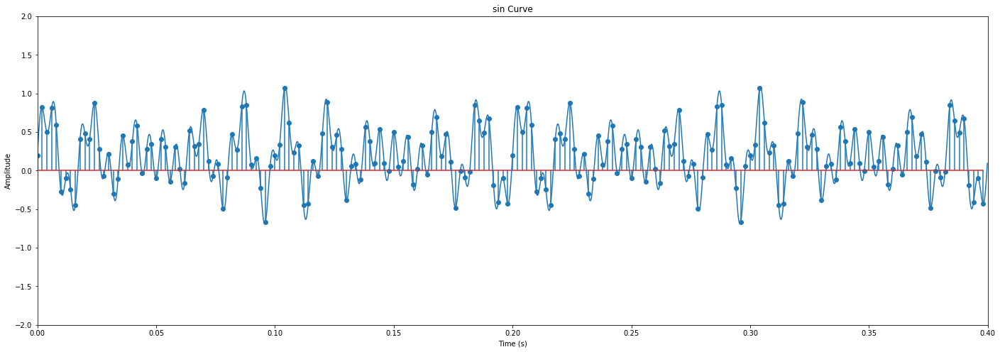

In [259]:
# 1a) and b)


import numpy as np
import matplotlib.pyplot as plt

# This bit of code is to simulate a "continous signal" which will look continous
# because the signal is "sampled" at 100 times the frequency or 5000 Hz
A=0.3 # Amplitude of the sin wave
f=50.0 # frequency of the sin wave in Hz
T=1/f
fs=100.0*f
Ts=1/fs # horizontal spacing of the points that "fake" a continuous signal
cycles=20 # how many cycles of the wave to save
t=np.arange(0,cycles*T,Ts) # horizontal coordinate of your sin curve
x=A*np.sin(2*np.pi*f*t)+A*np.sin(2*np.pi*f*(7/2)*t)+A*np.sin(2*np.pi*f*(6/5)*t)+0.2 # vertical value of your sin curve

# Sampling of the "continous signal" from above 
A1=0.3 # Amplitude of the sin wave
f1=50.0 # frequency of the sin wave in Hz
T1=1/f1
fs1=500
Ts1=1/fs1 # horizontal spacing of the points that "fake" a continuous signal
cycles1=20 # how many cycles of the wave to save
t1=np.arange(0,cycles1*T1,Ts1) # horizontal coordinate of your sin curve
x1=A1*np.sin(2*np.pi*f1*t1)+A1*np.sin(2*np.pi*f1*(7/2)*t1)+A1*np.sin(2*np.pi*f1*(6/5)*t1)+0.2 # vertical value of your sin curve


# Plotting the "Sampled" as a stem plot and "continous signal" as a plot
plt.figure(figsize=(24,8))
plt.axis([0,0.4,-2,2]) # we’re not plotting all cycles so we can see what’s going on
plt.stem(t1,x1,use_line_collection=True)
plt.plot(t,x)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title("sin Curve")
plt.show()
#k=0
#for k in range(0,20):
 #   print(x[k])

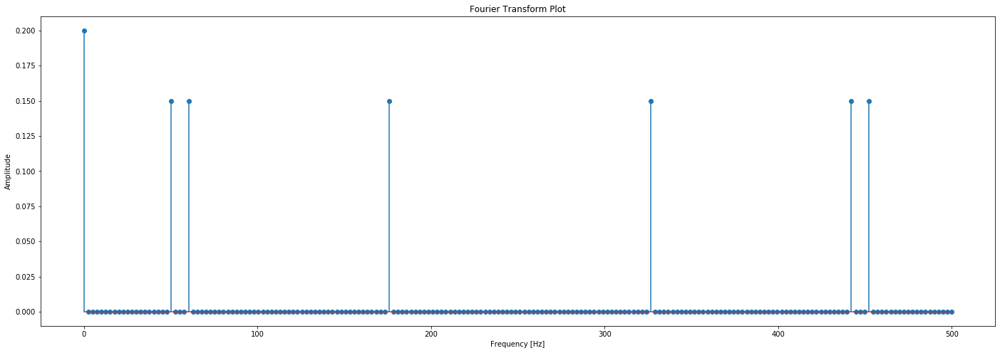

In [260]:
# 1c)

#Doing a fourier transform on the sampled data to view as a frequency spectrum
# Can use the plot to confirm the frequencies in the signal of 50, 60, 175 Hz
fft1 = np.fft.fft(x1) #xsamp is your stem plot data
N1 = x1.size
Tsamp1=1/fs1
f1 = np.linspace(0, 1 / Tsamp1, N1)
#Tsamp is the rate you sampled at (30 Hz, 12 Hz, 10 Hz, 7 Hz)
plt.figure(figsize=(24,8))
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.stem(f1,np.abs(fft1)/N1,use_line_collection=True)
plt.show()

# Upon visula inspection, the peaks occur at where expected

In [261]:
# 1d)

# Quantized the signal
# Need max and min  of signal to divide the range of values into 8 levels
maxS=max(x1)
#print(maxS)
minS=min(x1)
#print(minS)

# The quantizaton levels are calculated below
levels=8
binW=(maxS-minS)/levels
#print(binW)

# Assign each sampled value, x1, to a quantized level by rounding to nearest
# level, which reduces the quantizaton error as observed in the worksheet
length=len(x)
length1=len(x1)
#print(length)
QS=[0]*length1
i=0
j=0
for i in range(0,length1):
    for j in range(0,levels):
        # Checks if sampled value between what level
        if x1[i]> minS+binW*j and x1[i]< minS+binW*(j+1):
            # Checks whether which level it is closest to, to round
            if x1[i]> minS+binW*j and x1[i]< minS+(binW)*j+(binW/2):
                QS[i]= minS+binW*j
                #print(x1[i],minS+binW*j,QS[i],"down")
            else:
                QS[i]=minS+binW*(j+1)
                #print(x1[i],minS+binW*(j+1),QS[i],"up")


In [262]:
# 1e)

# Needed array for plotting sample and hold which is basically just the x1, 
# x1 is the first sampling we did or call it xsamp
# needed to replicate the x1 values to plot in 1g)
sampHold=[0]*length
ZOH=[0]*length
#print(length)

# ratio calculated to make ZOH list same number of values as "continous signal"
ratio=int(length/length1)
#print(ratio)
i=0
k=-ratio
# just replicated the values for every "ratio" number of values in ZOH 
# and sampHold
for i in range(0,length1):
    k += ratio
    j=0
    for j in range(0,ratio):
        #print(i,j+k)
        ZOH[k+j]=QS[i]
        sampHold[k+j]=x1[i]

#print(ZOH,x)

-1.0911606683559014


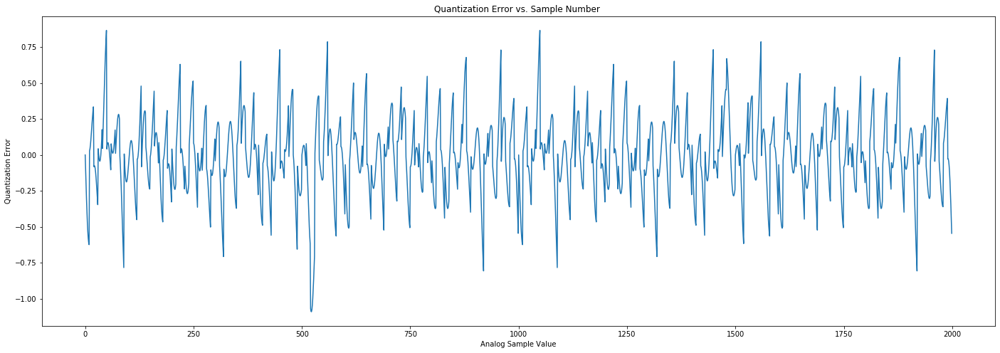

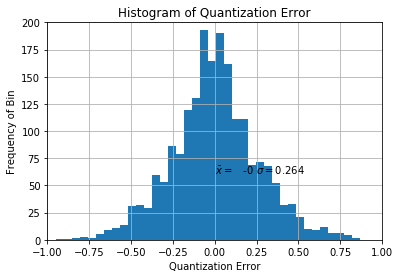

0.28867513459481287


In [263]:
# 1f)

# Initiated list for QE 
QE=[0]*length
sNumber=np.arange(0,length)

# calculated QE by subtracting ZOH from "continous signal"
i=0
for i in range(0,length):
    #print(ZOH[i],x[i],QE[i])
    QE[i]=ZOH[i]-x[i]
print(min(QE))

# Plotting the QU over the signal cycles
plt.figure(figsize=(24,8))
plt.xlabel("Analog Sample Value")
plt.ylabel("Quantization Error")
plt.title("Quantization Error vs. Sample Number ")
plt.plot(sNumber,QE)
plt.show()

# Plotting histogram of QE
plt.hist(QE,bins='auto')
plt.text(0,60, r'$\bar{x}=$%5.f $\sigma=$%5.3f' % (np.mean(QE), np.std(QE)))
plt.axis([-1.0,1.0, 0, 200])
plt.ylabel('Frequency of Bin')
plt.xlabel('Quantization Error')
plt.title('Histogram of Quantization Error')

plt.grid(True)
plt.show() 
print(np.sqrt(1/12))
# Mean is expected to be 0 for the Quantizaton Error,"Noise" which is what we 
# get. The standard deivation is expected to be 12^(-1/2) which is 0.288
# and my value is 0.264 which has a percent difference of only 8.6%. So,
# fair to say it reasonably agrees


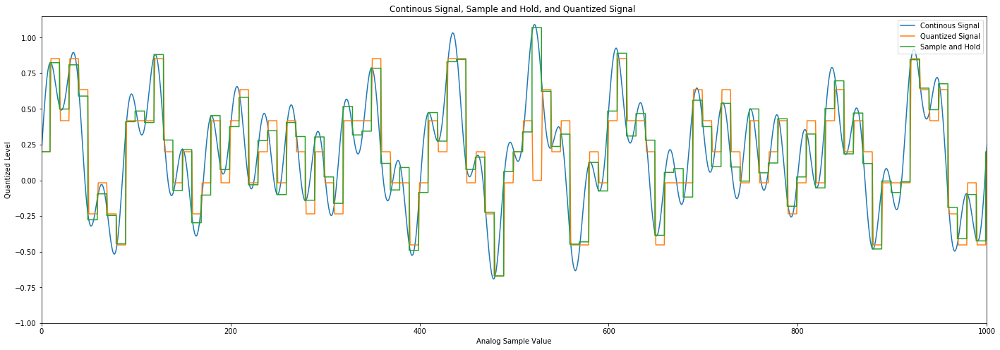

In [264]:
# 1g)

# Just plotting the graphs by sample value number
zL=np.arange(0,length)
qL=np.arange(0,length1)

plt.figure(figsize=(24,8))
plt.axis([0,1000,-1,1.15])
plt.xlabel("Analog Sample Value")
plt.ylabel("Quantized Level")
plt.title("Continous Signal, Sample and Hold, and Quantized Signal ")
plt.plot(x, label = "Continous Signal")
plt.plot(zL,ZOH,label = "Quantized Signal")
plt.step(zL,sampHold, label = "Sample and Hold")
plt.legend(loc= 'upper right')
plt.show()

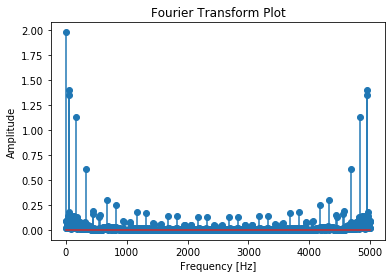

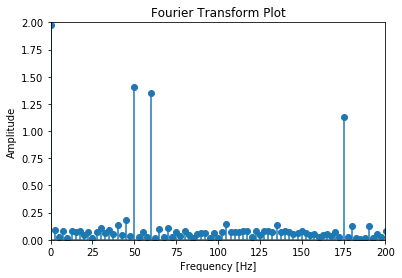

In [265]:
# 1h)

# Running fourier transform on our ZOH and plotting frequency spectrum as stem
# plot
fft1 = np.fft.fft(ZOH) #xsamp is your stem plot data
Tsamp1=1/fs
f1 = np.linspace(0, 1 / Tsamp1, length)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.stem(f1,np.abs(fft1)/N1,use_line_collection=True)
plt.show()

# Same plot as above to see that the peaks occur at where expected and they 
#do occur at 50 Hz, 60 Hz, 175 Hz
plt.axis([0,200,0,2])
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.stem(f1,np.abs(fft1)/N1,use_line_collection=True)
plt.show()

In [266]:
# 1i)

from scipy import signal

# Applying the Butterworth filter to remove unwanted frequencies as a low-pass
# filter
cutoff = 180 # cutoff frequency.
#The intensity of all frequencies above this will be reduced.
nyq = 0.5*fs # fs is the sampling rate of x_zoh
normal_cutoff = cutoff / nyq # normalized cutoff frequency
b, a = signal.butter(5, normal_cutoff, 'low')
x_smooth = signal.filtfilt(b, a, ZOH)


# 1j)

The cutoff frequency should be around 180 or higher as our maximum signal is 175 Hz. The frequencies in the signal are 50, 60 and 175 Hz which I would like to keep. Anything higher than 175 can be filtered out but have I like to leave some room for error and make sure 175 is not removed which is why I am not making it 176.


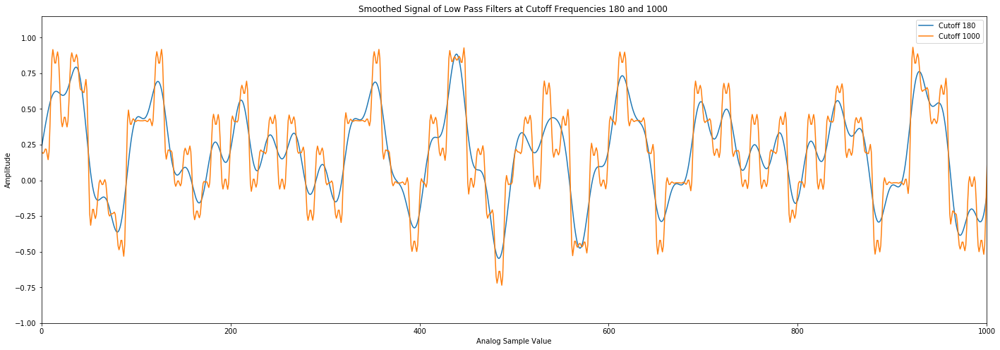

In [267]:
# 1k)

# Already have my decided cutoff frequency in 1i) so just needed the 1000 Hz
# cutoff which I have created another smooth 
cutoff1 = 1000 # cutoff frequency.
#The intensity of all frequencies above this will be reduced.
nyq = 0.5*fs # fs is the sampling rate of x_zoh
normal_cutoff1 = cutoff1 / nyq # normalized cutoff frequency
b1, a1 = signal.butter(5, normal_cutoff1, 'low')
x_smooth1 = signal.filtfilt(b1, a1, ZOH)

# Plotted on the same plot the 1000 Hz cutoff and 180 Hz cutoff filter
plt.figure(figsize=(24,8))
plt.axis([0,1000,-1,1.15])
plt.plot(x_smooth,label = "Cutoff 180")
plt.plot(x_smooth1,label = "Cutoff 1000")
plt.legend(loc= 'upper right')
plt.xlabel("Analog Sample Value")
plt.ylabel("Amplitude")
plt.title("Smoothed Signal of Low Pass Filters at Cutoff Frequencies 180 and 1000 ")
plt.show()

# Can see the smoothing effects much more effective at 180 Hz cutoff

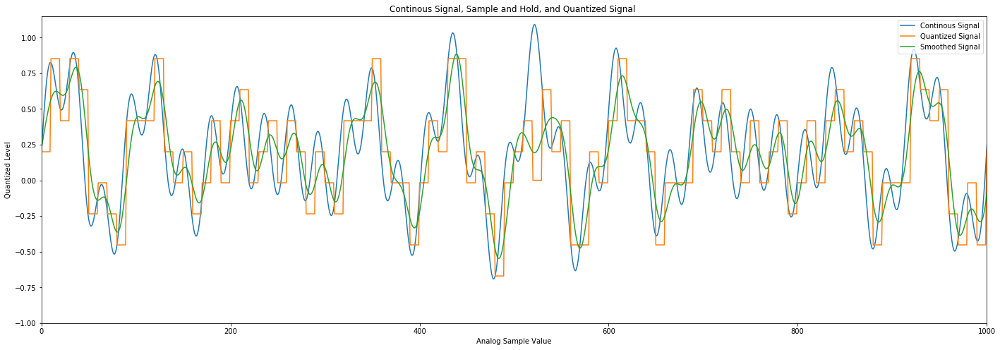

In [268]:
# 1l)

# Plotting the "continous signal", ZOH, and smoothed signal on same plot
plt.figure(figsize=(24,8))
plt.axis([0,1000,-1,1.15])
plt.xlabel("Analog Sample Value")
plt.ylabel("Quantized Level")
plt.title("Continous Signal, Sample and Hold, and Quantized Signal ")
plt.plot(x, label = "Continous Signal")
plt.plot(ZOH,label = "Quantized Signal")
plt.plot(x_smooth,label = "Smoothed Signal")
plt.legend(loc= 'upper right')
plt.show()

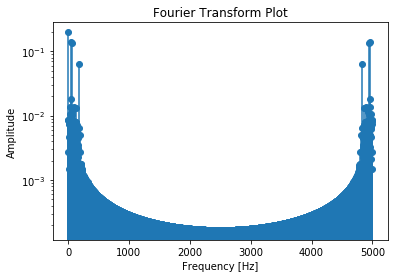

In [269]:
# 1m)

# Applying fourier transform on smoothed signal and the plotting as stem
# plot on frequency spectrum
# Viewed as log of y axis to see the samller signals of freqeuncies 
# get cut off
fft2 = np.fft.fft(x_smooth) #xsamp is your stem plot data
Tsamp1=1/fs
N2=len(x_smooth)
f2 = np.linspace(0, 1 / Tsamp1, N2)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.yscale("log")
plt.stem(f2,np.abs(fft2)/N2,use_line_collection=True)
plt.show()

# Summary

The ADC process introduces some error when sampling because it holds a value of the continous signal for a frequency less than that of the signal. Another process is quantization which stores the sampled values to equally seperate levels from the continous signal. Quantization error occurs when the value stored digitally has a difference than the analog signal. When trying to reconstruct a wave the after ADC, some values of the original signal are lost and some can be removed by adding filters. The final output of reconstruction the signal gives a signal that looks very much similar to the original and depending on what modifications (low pass filter, high pass filter etc) were applied, the graph conveys a signal that is has less noise without losing the core of the original signal.


# 2a) and 2b)
Importing tuning fork files

Plotting the left channel of the sound file

Plotting only segment of data to view spacing between voltages

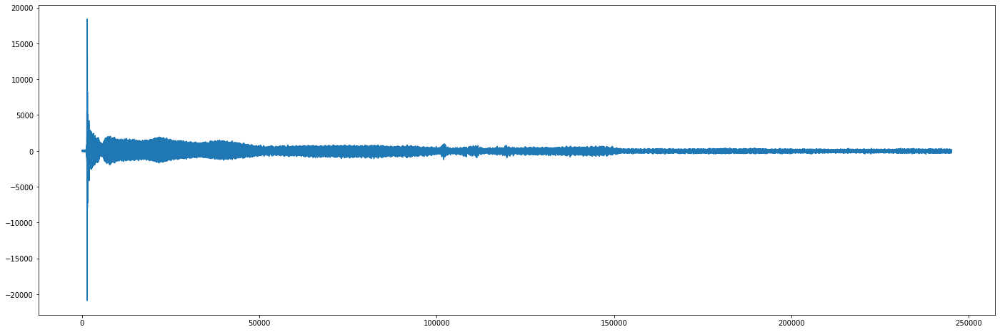

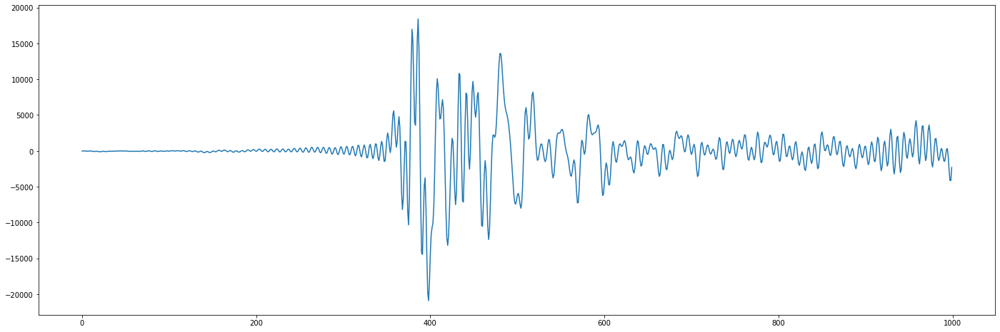

In [271]:
import IPython
from scipy.io import wavfile

IPython.display.Audio("512Hz.wav")
fs01, data = wavfile.read('512Hz.wav') #fs is the sampling rate
x01 = data[:,0] # Left Channel
y01 = data[:,1] # Right Channel


plt.figure(figsize=(24,8))
plt.plot(x01)
plt.show()

plt.figure(figsize=(24,8))
plt.plot(x01[1000:2000])
plt.show()
IPython.display.Audio("512Hz.wav")

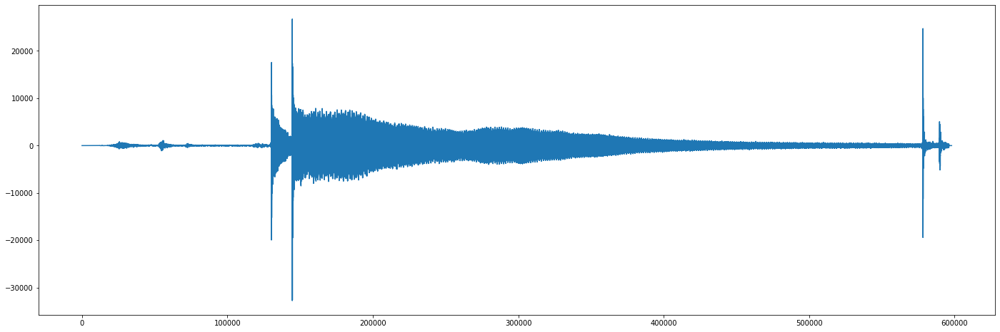

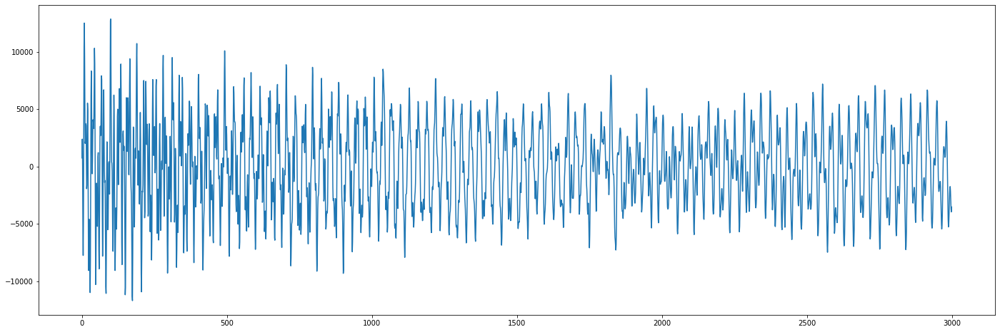

In [272]:
import IPython
from scipy.io import wavfile

fs02, data = wavfile.read("512Hz-523Hz.wav") #fs is the sampling rate
x02 = data[:,0] # Left Channel
y02 = data[:,1] # Right Channel

plt.figure(figsize=(24,8))
plt.plot(x02)
plt.show()

plt.figure(figsize=(24,8))
plt.plot(x02[145000:148000])
plt.show()

IPython.display.Audio("512Hz-523Hz.wav")

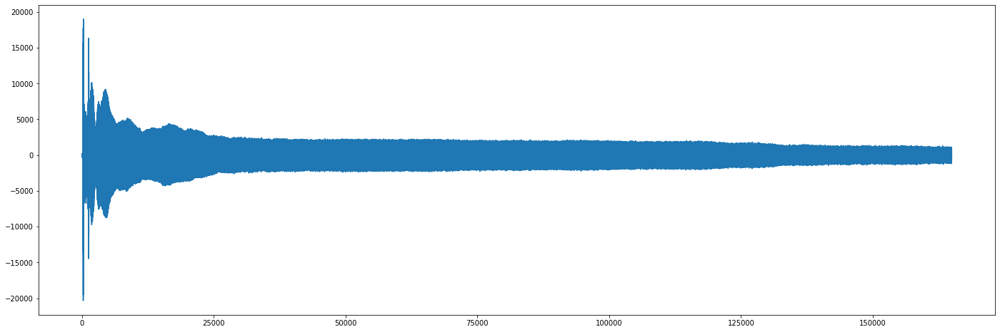

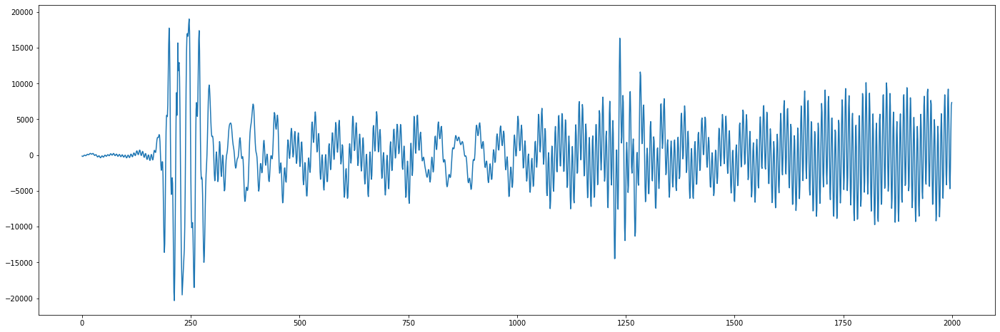

In [273]:
import IPython
from scipy.io import wavfile


fs03, data = wavfile.read("1024Hz.wav") #fs is the sampling rate
x03 = data[:,0] # Left Channel
y03 = data[:,1] # Right Channel

plt.figure(figsize=(24,8))
plt.plot(x03)
plt.show()

plt.figure(figsize=(24,8))
plt.plot(x03[0:2000])
plt.show()

IPython.display.Audio("1024Hz.wav")

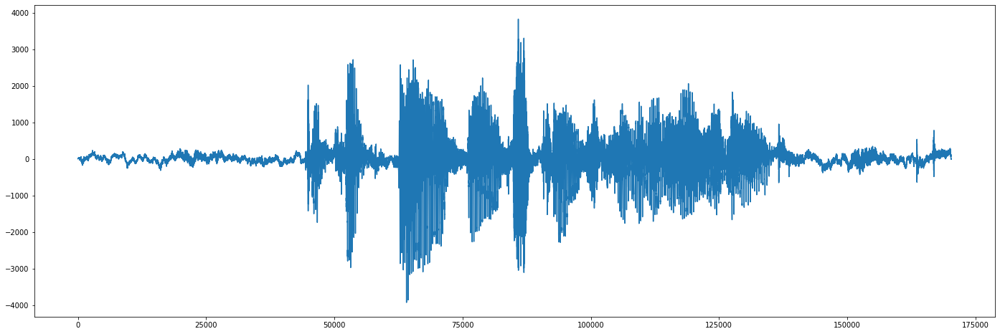

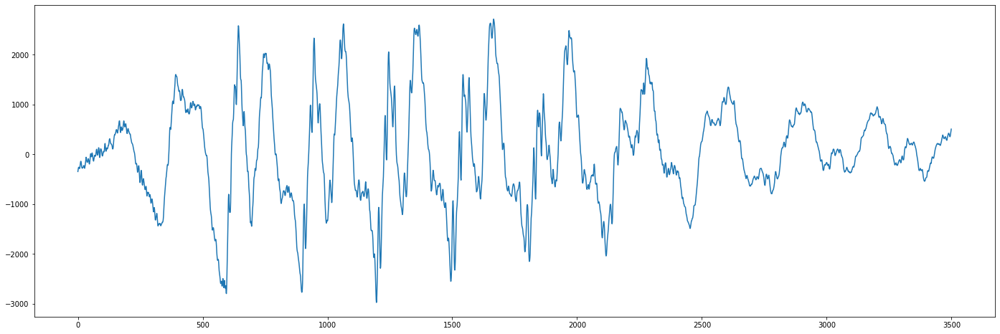

In [274]:
import IPython
from scipy.io import wavfile


fs04, data = wavfile.read('LAB1.wav') #fs is the sampling rate
x04 = data[:,0] # Left Channel
y04 = data[:,1] # Right Channel

plt.figure(figsize=(24,8))
plt.plot(x04)
plt.show()

plt.figure(figsize=(24,8))
plt.plot(x04[52000:55500])
plt.show()
IPython.display.Audio("LAB1.wav")

# 2c)

Applying the fourier transform to wave data and plotting as stem plot

on frequency spectrum

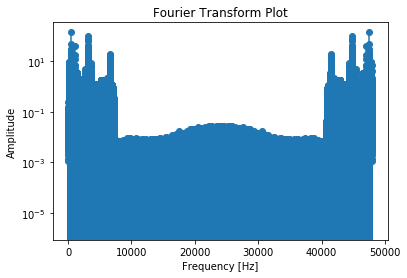

In [275]:
fft01 = np.fft.fft(x01) #xsamp is your stem plot data
Tsamp01=1/fs01
N01=len(x01)
f01 = np.linspace(0, 1 / Tsamp01, N01)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.yscale("log")
plt.stem(f01,np.abs(fft01)/N01,use_line_collection=True)
plt.show()



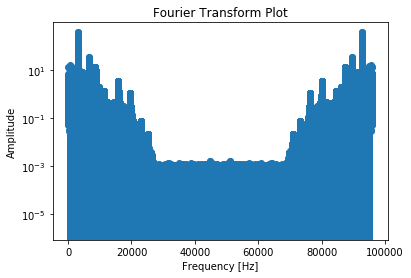

In [276]:
fft02 = np.fft.fft(x02) #xsamp is your stem plot data
N02=len(x02)
Tsamp02=1/fs02
f02 = np.linspace(0, 1 / Tsamp02, N02)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.yscale("log")
plt.stem(f02,np.abs(fft02)/N02,use_line_collection=True)
plt.show()

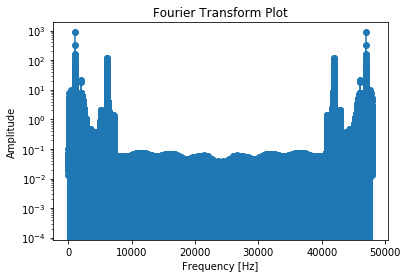

In [277]:
fft03 = np.fft.fft(x03) #xsamp is your stem plot data
N03=len(x03)
Tsamp03=1/fs03
f03 = np.linspace(0, 1 / Tsamp03, N03)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.yscale("log")
plt.stem(f03,np.abs(fft03)/N03,use_line_collection=True)
plt.show()

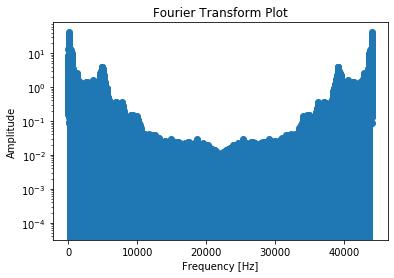

In [278]:
fft04 = np.fft.fft(x04) #xsamp is your stem plot data
Tsamp04=1/fs04
N04=len(x04)
f04 = np.linspace(0, 1 / Tsamp04, N04)
#Tsamp is the rate you sampled at (500 Hz)
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
plt.yscale("log")
plt.stem(f04,np.abs(fft04)/N01,use_line_collection=True)
plt.show()

# 2d)

Applying Butterworth filter as high and low pass on data to smooth out sound

In [279]:
hi_cutoff01 = 300
nyq01 = 0.5 * fs01
normal_cutoff01 = hi_cutoff01 / nyq01
b01, a01 = signal.butter(8, normal_cutoff01, btype='high', analog=False)
output01 = signal.filtfilt(b01, a01, x01)

low_cutoff01 = 8000
nyq01 = 0.5 * fs01
normal_cutoff01 = low_cutoff01 / nyq01
c01, d01 = signal.butter(8, normal_cutoff01, btype='low', analog=False)
output01 = signal.filtfilt(c01, d01, output01)


In [281]:
hi_cutoff02 = 450
nyq02 = 0.5 * fs02
normal_cutoff02 = hi_cutoff02 / nyq02
b02, a02 = signal.butter(8, normal_cutoff02, btype='high', analog=False)
output02 = signal.filtfilt(b02, a02, x02)

low_cutoff02 = 3000
nyq02 = 0.5 * fs02
normal_cutoff02 = low_cutoff02 / nyq02
c02, d02 = signal.butter(8, normal_cutoff02, btype='low', analog=False)
output02 = signal.filtfilt(c02, d02, output02)

In [282]:
hi_cutoff03 = 800
nyq03 = 0.5 * fs03
normal_cutoff03 = hi_cutoff03 / nyq03
b03, a03 = signal.butter(8, normal_cutoff03, btype='high', analog=False)
output03 = signal.filtfilt(b03, a03, x03)

low_cutoff03 = 1200
nyq03 = 0.5 * fs03
normal_cutoff03 = low_cutoff03 / nyq03
c03, d03 = signal.butter(8, normal_cutoff03, btype='low', analog=False)
output03 = signal.filtfilt(c03, d03, output03)

In [283]:
# the values of the hi and low cutoffs were chosen after testing many different ranges of 
# frequencies to obtain the cleanest sound without background noise
hi_cutoff04 = 400
nyq04 = 0.5 * fs04
normal_cutoff04 = hi_cutoff04 / nyq04
b04, a04 = signal.butter(8, normal_cutoff04, btype='high', analog=False)
output04 = signal.filtfilt(b04, a04, x04)


low_cutoff04 = 4800
nyq04= 0.5 * fs04
normal_cutoff04 = low_cutoff04 / nyq04
b04, a04 = signal.butter(8, normal_cutoff04, btype='low', analog=False)
output04 = signal.filtfilt(b04, a04, output04)


# 2e)

Fourier transforming the smoothed wave data and viewing effects of plot

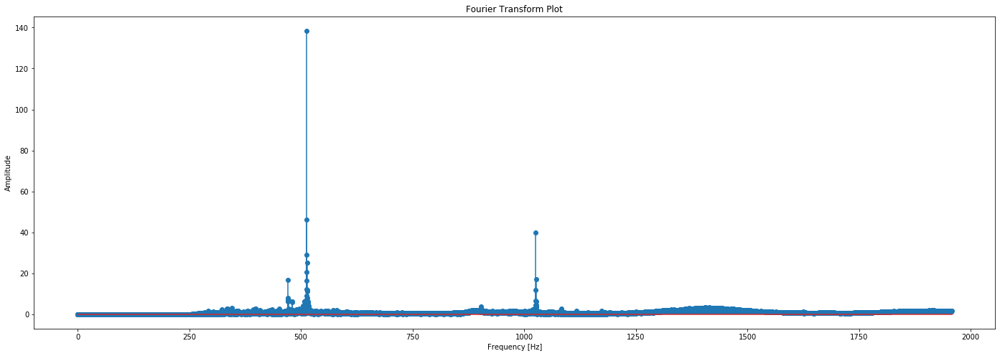

In [293]:
# Fourier transform on the filtered 512 Hz wave 
# do not log the y axis to view the spikes in frequencies better

fft01 = np.fft.fft(output01) #xsamp is your stem plot data
Tsamp01=1/fs01
N01=len(output01)
f01 = np.linspace(0, 1 / Tsamp01, N01)
#Tsamp is the rate you sampled at (500 Hz)
plt.figure(figsize=(24,8))
#plt.axis([0,1000,0,100])
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
#plt.yscale("log")
plt.stem(f01[0:10000],np.abs(fft01)[0:10000]/N01,use_line_collection=True)
plt.show()

#Frequency is expected to be around 512 Hz which it looks like

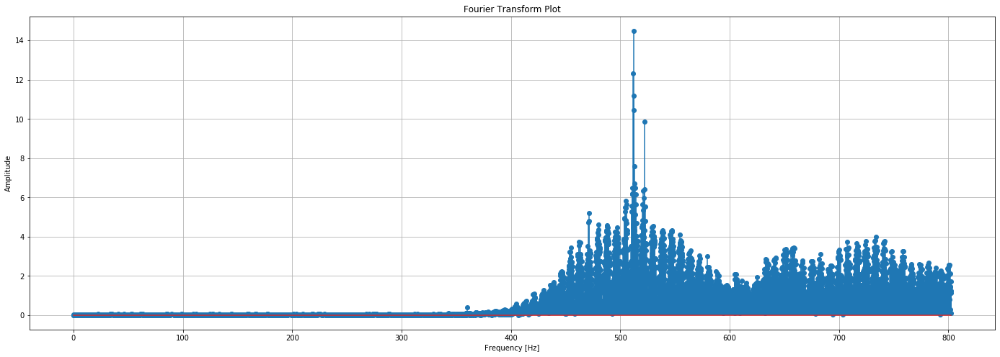

In [294]:
# Fourier transform on the filtered 512-523 Hz wave 

fft02 = np.fft.fft(output02) #xsamp is your stem plot data
N02=len(output02)
Tsamp02=1/fs02
f02 = np.linspace(0, 1 / Tsamp02, N02)
#Tsamp is the rate you sampled at (5000 Hz)
plt.figure(figsize=(24,8))
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
#plt.yscale("log")
plt.grid(True)
plt.stem(f02[0:5000],np.abs(fft02)[0:5000]/N02,use_line_collection=True)
plt.show()

# Looks like frequency is around 512-523 Hz even though it should be only one frequency 
# I think the small time frame of one playing before the other gives seperate frequency peaks
# Beat frequency will be viewed in last part

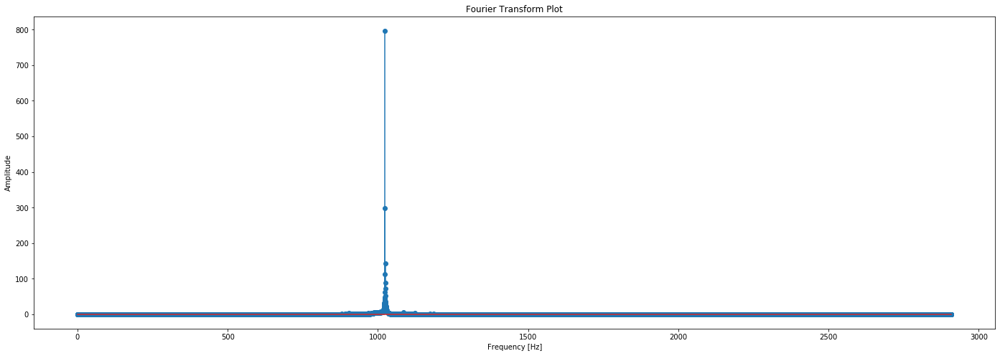

In [295]:
# Fourier transform on filtered 1024 Hz wave

fft03 = np.fft.fft(output03) #xsamp is your stem plot data
N03=len(output03)
Tsamp03=1/fs03
f03 = np.linspace(0, 1 / Tsamp03, N03)
#Tsamp is the rate you sampled at (500 Hz)
plt.figure(figsize=(24,8))
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
#plt.yscale("log")
plt.stem(f03[0:10000],np.abs(fft03)[0:10000]/N03,use_line_collection=True)
plt.show()

# After filtering out majority of frequencies, the single peak around 1024 Hz is looking nice

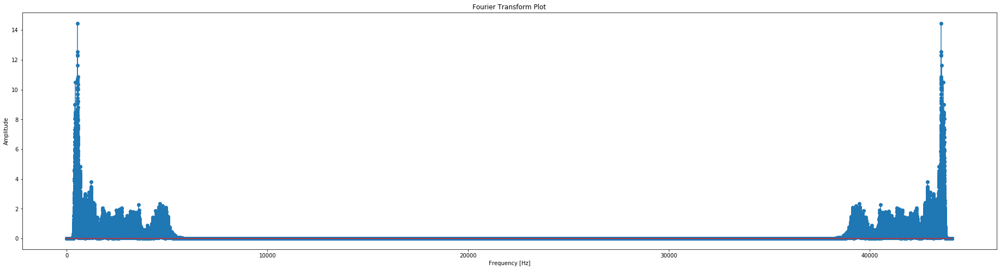

In [296]:
# Fourier transform on my filtered voice recording

fft04 = np.fft.fft(output04) #xsamp is your stem plot data
Tsamp04=1/fs04
N04=len(output04)
f04 = np.linspace(0, 1 / Tsamp04, N04)
#Tsamp is the rate you sampled at (500 Hz)
plt.figure(figsize=(32,8))
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
#plt.yscale("log")
plt.stem(f04,np.abs(fft04)/N04,use_line_collection=True)
plt.show()

# 2f)

Writing filtered wave to wav file

& 

Listening to smoother sound

In [297]:

filtered_out01 = np.asarray(output01, dtype=np.int16)
wavfile.write('filtered512.wav',fs01,filtered_out01)

IPython.display.Audio("filtered512.wav")


In [298]:

filtered_out02 = np.asarray(output02, dtype=np.int16)
wavfile.write('filtered512523.wav',fs02,filtered_out02)

IPython.display.Audio("filtered512523.wav")

In [299]:

filtered_out03 = np.asarray(output03, dtype=np.int16)
wavfile.write('filtered1024.wav',fs03,filtered_out03)

IPython.display.Audio("filtered1024.wav")

In [300]:

filtered_out04 = np.asarray(output04, dtype=np.int16)
wavfile.write('filteredME.wav',fs04,filtered_out04)

IPython.display.Audio("filteredME.wav")

# 2g)

Filtering out the original wave to view the beat frequency expected at 11 Hz because the last time the wave was filtered to remove noise and the beat frequency was part of frequencies which had a lot of background noise

In [319]:

high_cutoffBeat = 150
nyqBeat = 0.5 * fs04
normal_cutoffBeat = high_cutoffBeat / nyqBeat
cBeat, dBeat = signal.butter(8, normal_cutoffBeat, btype='high', analog=False)
outputBeat = signal.filtfilt(cBeat, dBeat, x04)


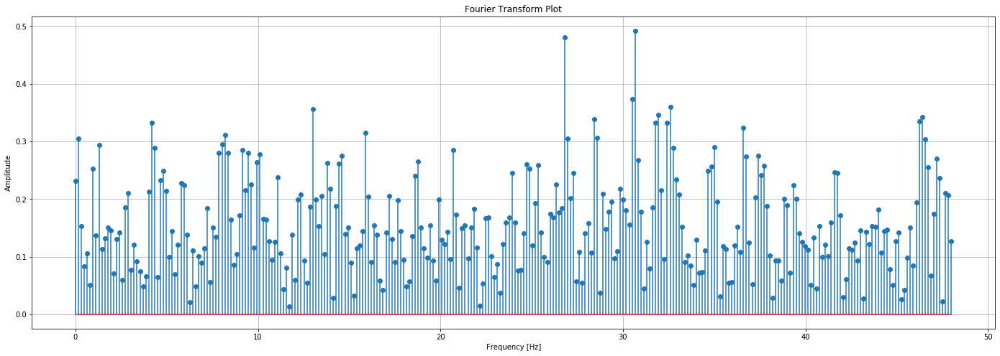

In [320]:
fftBeat = np.fft.fft(outputBeat) #xsamp is your stem plot data
NBeat=len(outputBeat)
TsampBeat=1/fs02
fBeat = np.linspace(0, 1 / TsampBeat, NBeat)
#Tsamp is the rate you sampled at (5000 Hz)
plt.figure(figsize=(24,8))
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.title("Fourier Transform Plot")
#plt.yscale("log")
plt.grid(True)
plt.stem(f02[0:300],np.abs(fftBeat)[0:300]/NBeat,use_line_collection=True)
plt.show()

# It is kind of visible that around 11 hz there are a series of spikes

# 1h)

In [321]:
# Saving the voice recording after low frequencies filtered in two cells above

filtered_outBeat = np.asarray(outputBeat, dtype=np.int16)
wavfile.write('1hLowFiltered.wav',fs04,filtered_outBeat)

IPython.display.Audio("1hLowFiltered.wav")